In [1]:
%load_ext autoreload
%autoreload 2
import warnings
import numpy as np
import time
import os
from dotenv import load_dotenv
os.environ["USE_PYGEOS"] = "0"
import napari_sparrow as nas
from spatialdata import read_zarr
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from random import sample 
import scanpy as sc
import seaborn as sns
import anndata as ad
%run own_and_modified_functions.ipynb
warnings.simplefilter(action='ignore')

the value of the environment variable BASIC_DCT_BACKEND is not in ["JAX","SCIPY"]


In [2]:
OUTPUT_DIR = '/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data'
sdata = read_zarr( os.path.join(  OUTPUT_DIR, 'sdata.zarr'  ) )
anndata = sc.read('/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/anndataNucA11') # reset original anndata
# delete anndata
del sdata.table
# create anndata
sdata.table = anndata

In [3]:
n_pca = np.count_nonzero(sdata.table.uns['pca']['variance_ratio'] > 0.01)
make_umap(sdata,n_PCAs=n_pca,n_neighbors=15) # umap only used for the visualization, does not have an effect on the annotation with 'score_genes'

In [4]:
path_mg = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm.csv"

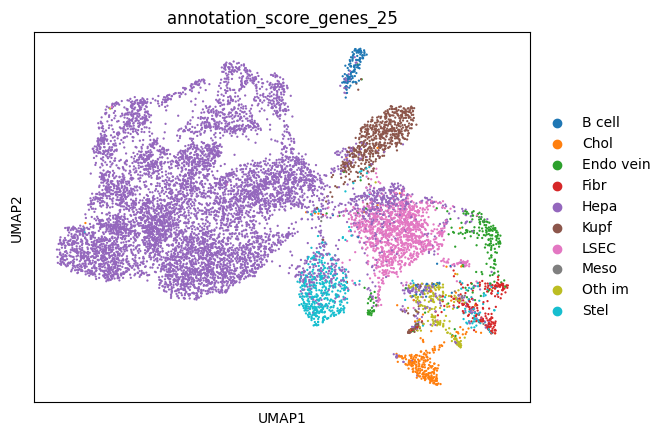

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_score_genes_25
B cell                      1.371571
Chol                        2.404703
Endo vein                   1.986106
Fibr                        1.745636
Hepa                       69.825436
Kupf                        5.700036
LSEC                       10.705379
Meso                        0.106876
Oth im                      1.656573
Stel                        4.497684


In [5]:
# Original score_genes
mg_dict, scoresper_cluster = score_genes_bins(
    sdata = sdata,
    path_marker_genes = path_mg,
    bins = 25)
visualize_classification(sdata,'annotation_score_genes_25','umap_23_15',"/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm.csv",plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

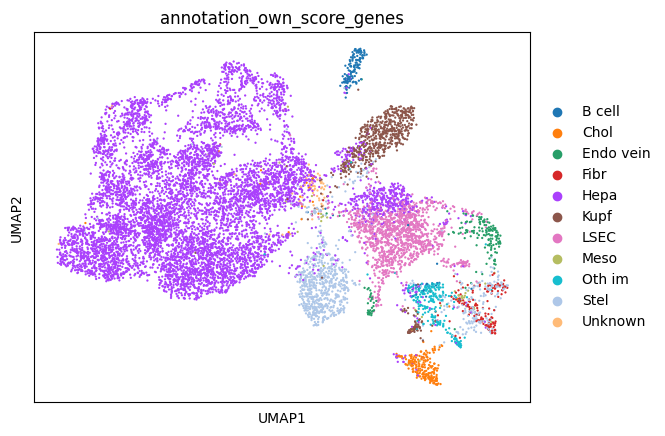

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes
B cell                       1.522978
Chol                         2.110794
Endo vein                    1.549697
Fibr                         1.309227
Hepa                        65.879943
Kupf                         5.735661
LSEC                        11.311008
Meso                         0.400784
Oth im                       2.084076
Stel                         7.579266
Unknown                      0.516566


,Hepa,LSEC,Endo vein,Chol,Kupf,Stel,Fibr,B cell,Meso,Oth im
0,0.538750,NaN,0.021096,0.085765,0.021767,NaN,0.020318,NaN,NaN,0.038485
1,NaN,0.055902,NaN,NaN,0.376261,NaN,0.241621,NaN,0.526007,NaN
2,NaN,NaN,NaN,NaN,0.019384,NaN,0.274330,NaN,0.717227,NaN
3,0.199726,NaN,NaN,0.036456,NaN,NaN,0.154209,NaN,0.229382,NaN
4,0.234711,NaN,NaN,0.069145,NaN,0.056901,0.022204,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
11223,0.313497,NaN,NaN,0.059235,NaN,0.061714,0.020161,NaN,NaN,NaN
11224,0.511616,NaN,NaN,0.081015,0.051679,0.072720,0.028773,NaN,NaN,NaN
11225,0.354052,NaN,NaN,0.058203,0.049886,NaN,NaN,NaN,NaN,NaN
11226,NaN,NaN,NaN,NaN,0.063038,0.602880,0.242782,NaN,NaN,NaN


In [6]:
# Own score genes, just the MinMax scaling
scores = own_score_genes(sdata.table,path_mg)
visualize_classification(sdata,'annotation_own_score_genes','umap_23_15',path_mg,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)
scores

Hepa         0.658799
LSEC         0.113110
Stel         0.075793
Kupf         0.057357
Chol         0.021108
Oth im       0.020841
Endo vein    0.015497
B cell       0.015230
Fibr         0.013092
Unknown      0.005166
Meso         0.004008
Name: annotation_own_score_genes, dtype: float64


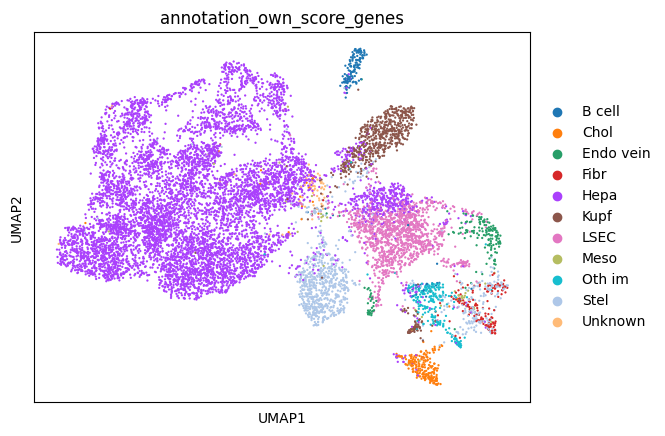

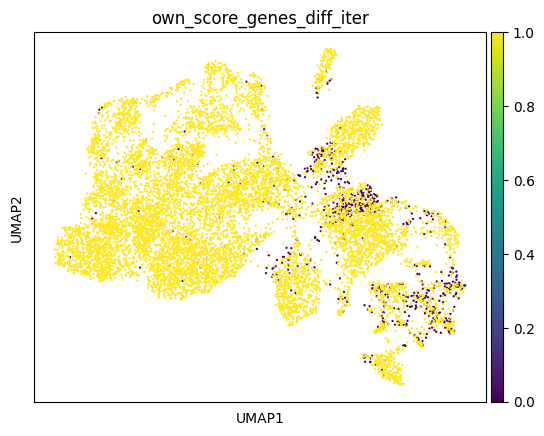

0.06795511221945137


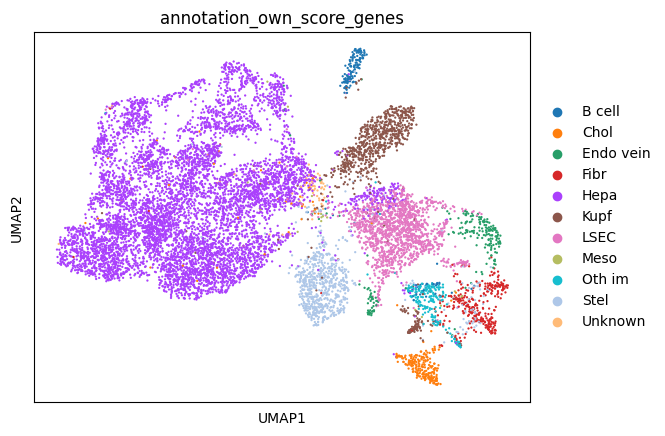

Hepa         0.621482
LSEC         0.128696
Kupf         0.071696
Stel         0.063680
Fibr         0.029302
Chol         0.024849
Endo vein    0.019059
Oth im       0.017902
B cell       0.016120
Unknown      0.005166
Meso         0.002048
Name: annotation_own_score_genes, dtype: float64


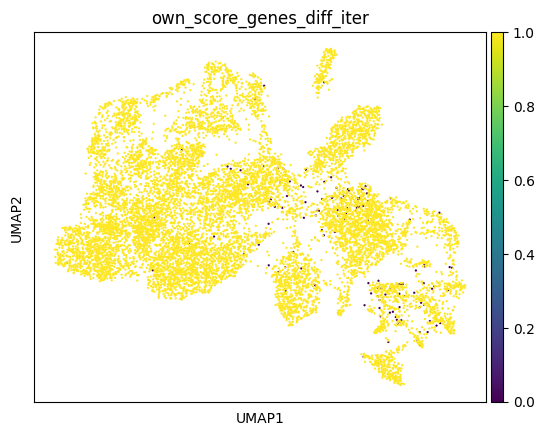

0.011756323477021732


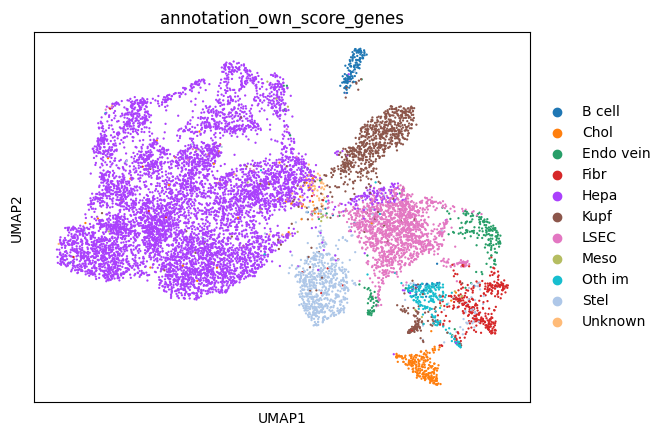

Hepa         0.616227
LSEC         0.130121
Kupf         0.076149
Stel         0.061275
Fibr         0.031261
Chol         0.024581
Endo vein    0.019594
Oth im       0.018703
B cell       0.014784
Unknown      0.005166
Meso         0.002138
Name: annotation_own_score_genes, dtype: float64


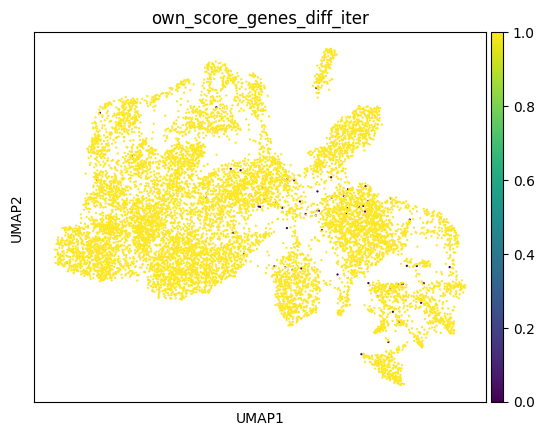

0.0057000356252226575


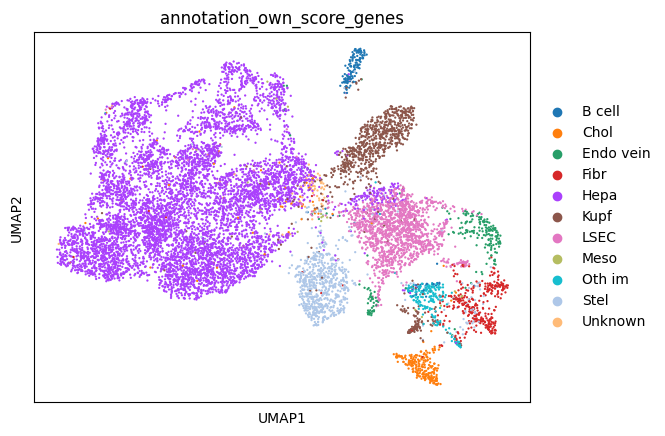

Hepa         0.616405
LSEC         0.128162
Kupf         0.075793
Stel         0.062700
Fibr         0.031706
Chol         0.026006
Endo vein    0.019327
Oth im       0.017545
B cell       0.015052
Unknown      0.005166
Meso         0.002138
Name: annotation_own_score_genes, dtype: float64


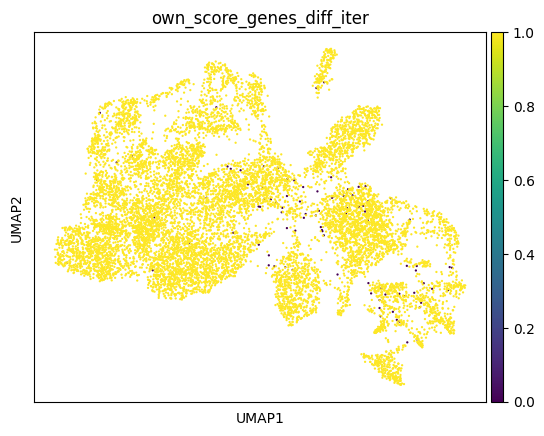

0.008817242607766299


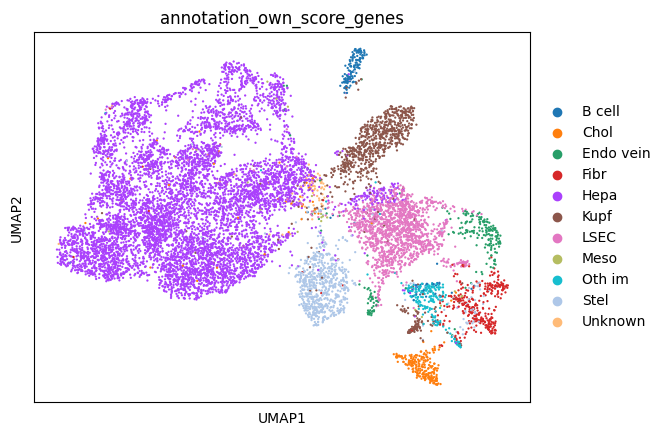

Hepa         0.617385
LSEC         0.130923
Kupf         0.074546
Stel         0.060474
Fibr         0.030460
Chol         0.025027
Endo vein    0.019594
Oth im       0.018080
B cell       0.016120
Unknown      0.005166
Meso         0.002227
Name: annotation_own_score_genes, dtype: float64


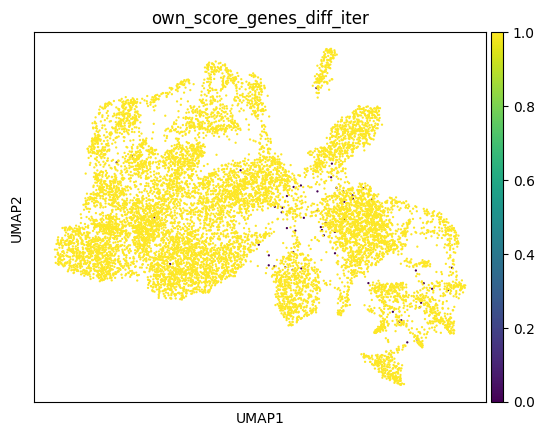

0.005165657285358034


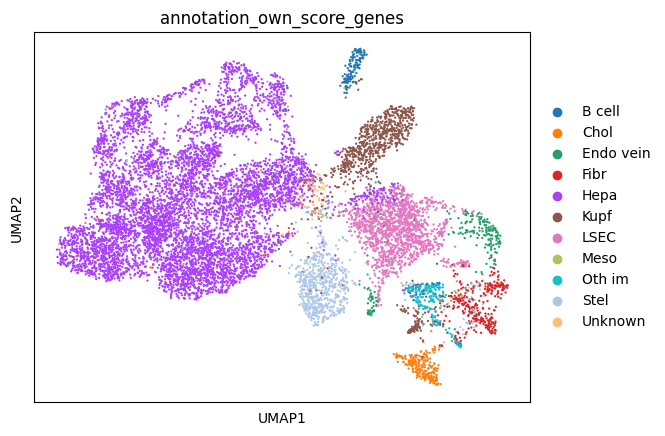

Hepa         0.615604
LSEC         0.131813
Kupf         0.073210
Stel         0.062611
Fibr         0.031796
Chol         0.024849
Endo vein    0.019594
Oth im       0.017545
B cell       0.015675
Unknown      0.005166
Meso         0.002138
Name: annotation_own_score_genes, dtype: float64


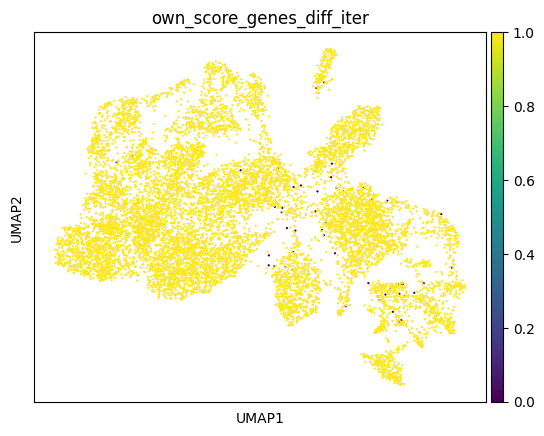

0.004809405058781618


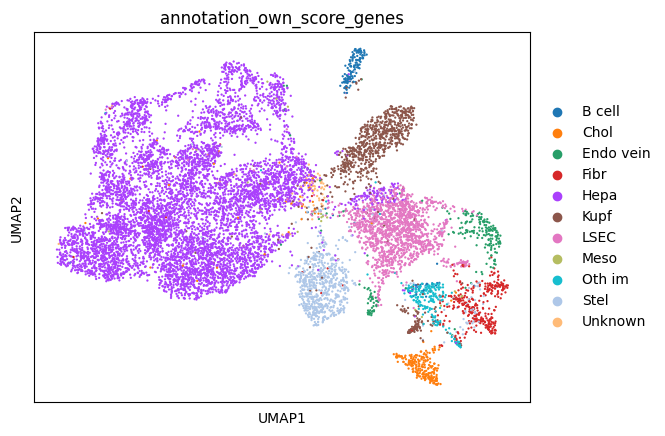

Hepa         0.616673
LSEC         0.130834
Kupf         0.074279
Stel         0.060652
Fibr         0.031261
Chol         0.024938
Endo vein    0.020217
Oth im       0.019059
B cell       0.014784
Unknown      0.005166
Meso         0.002138
Name: annotation_own_score_genes, dtype: float64


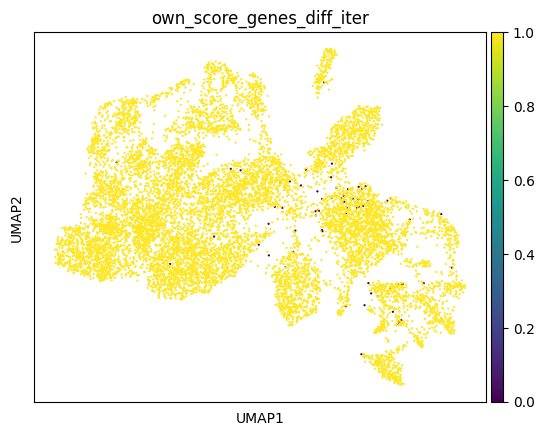

0.006234413965087282


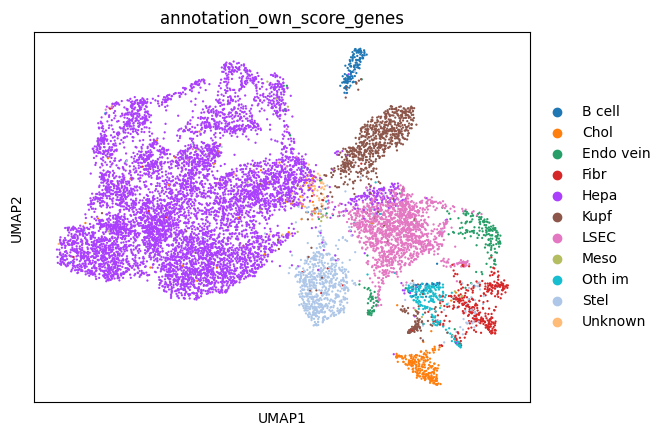

Hepa         0.619790
LSEC         0.129141
Kupf         0.072408
Stel         0.061810
Fibr         0.031706
Chol         0.025027
Endo vein    0.019416
Oth im       0.018169
B cell       0.015230
Unknown      0.005166
Meso         0.002138
Name: annotation_own_score_genes, dtype: float64


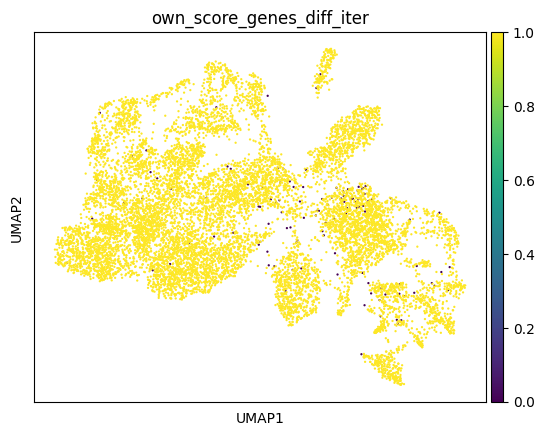

0.010509440684004275


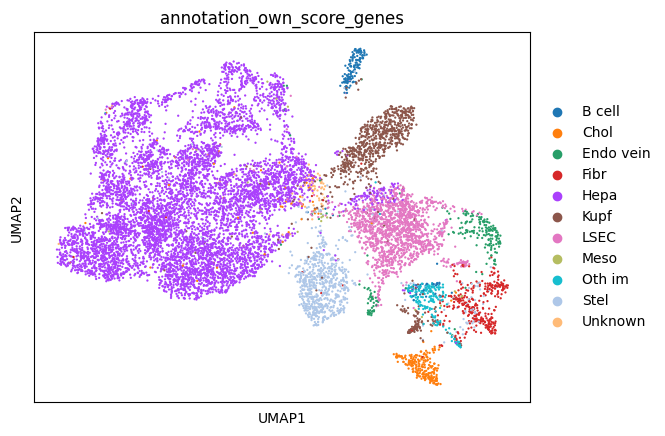

Hepa         0.612398
LSEC         0.132259
Kupf         0.074368
Stel         0.064125
Fibr         0.031974
Chol         0.025917
Endo vein    0.019149
Oth im       0.016744
B cell       0.015764
Unknown      0.005166
Meso         0.002138
Name: annotation_own_score_genes, dtype: float64


[0.06795511221945137,
 0.011756323477021732,
 0.0057000356252226575,
 0.008817242607766299,
 0.005165657285358034,
 0.004809405058781618,
 0.006234413965087282,
 0.010509440684004275]

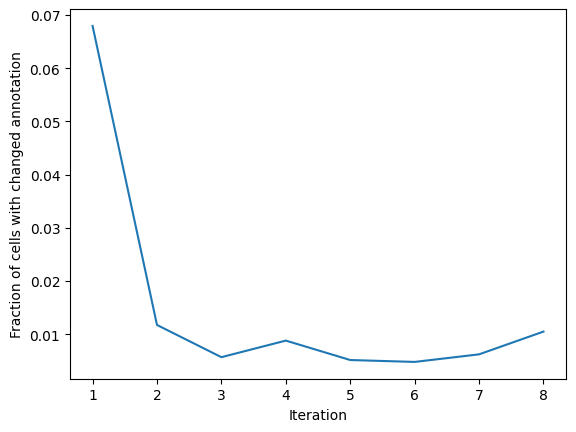

In [7]:
# Own score genes iterative
own_score_genes_iterative(sdata.table,path_mg,nr_iterations=8)

In [8]:
sdata.table.obs.columns

Index(['region', 'instance', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes',
       'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize',
       'annotation_score_genes_25', 'cleanliness_score_genes_25',
       'score_celltype_own_score_genes',
       'second_score_celltype_own_score_genes', 'cleanliness_own_score_genes',
       'own_score_genes_diff_iter', 'annotation_own_score_genes_previous',
       'annotation_own_score_genes'],
      dtype='object')

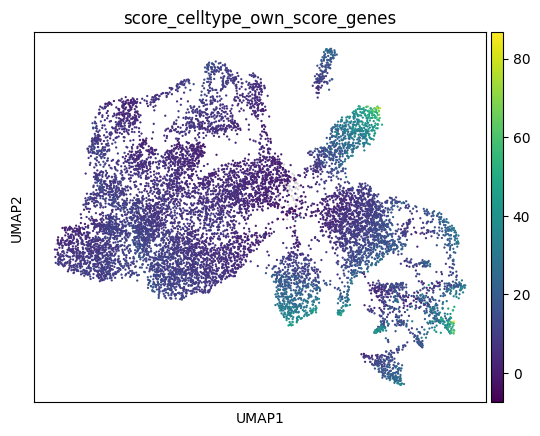

In [9]:
sc.pl.umap(sdata.table,color=['score_celltype_own_score_genes'])

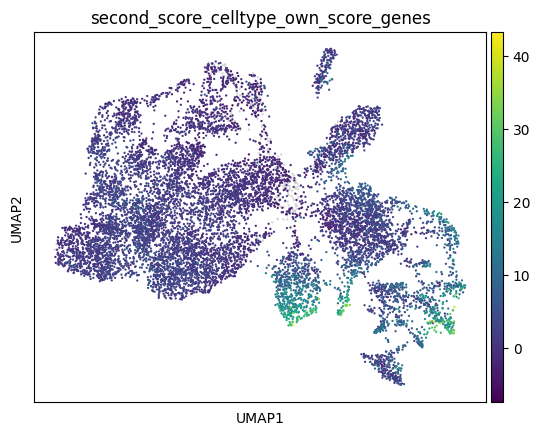

In [10]:
sc.pl.umap(sdata.table,color=['second_score_celltype_own_score_genes'])

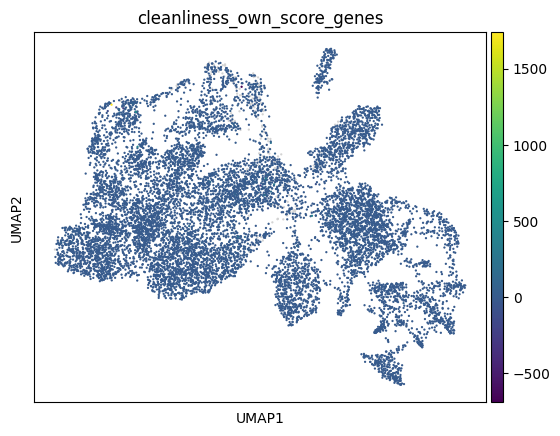

In [11]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes'])

Hepa         10
LSEC         11
Endo vein     9
Chol          7
Kupf         16
Stel         16
Fibr         21
B cell        4
Meso          5
Oth im        4
dtype: int64


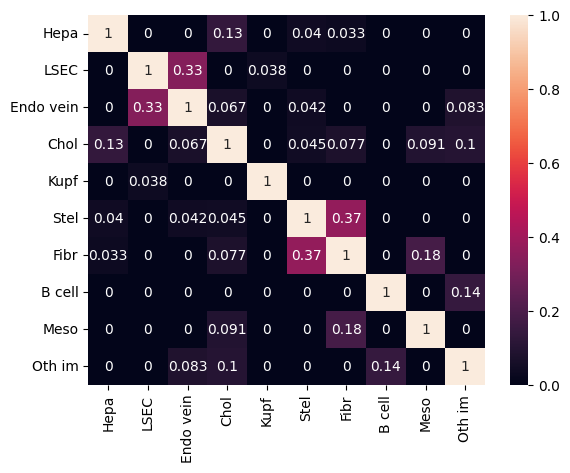

In [12]:
Jaccard_similarity_matrix(path_mg)

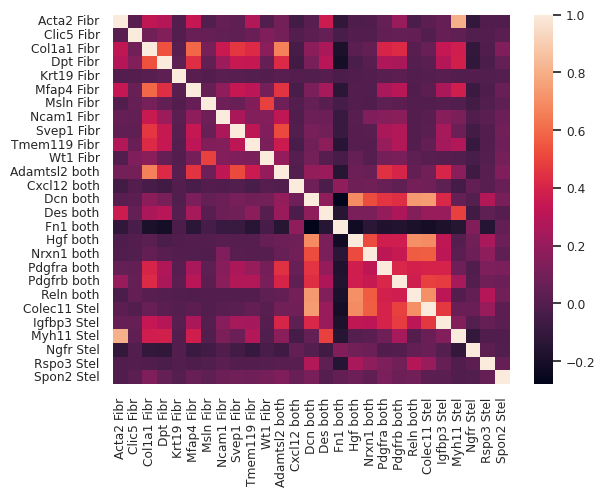

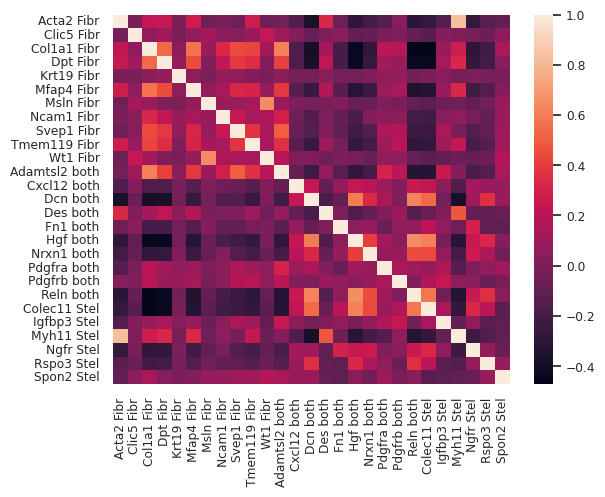

In [13]:
# plot correlation matrix of the gene expression of the marker genes of 2 confused cell types
# confusion between fibroblasts and stellate cells
# expression of all cells
sns.set(font_scale=0.8)
correlation_matrix_expression_marker_genes_of_2_cell_types(sdata.table,path_mg,'Fibr','Stel')
plt.show()
# expression of cells that are classified as fibroblasts or stellate cells
adata_sub = sdata.table[(sdata.table.obs['annotation_own_score_genes'] == 'Fibr') | (sdata.table.obs['annotation_own_score_genes'] == 'Stel'),:]
correlation_matrix_expression_marker_genes_of_2_cell_types(adata_sub,path_mg,'Fibr','Stel')

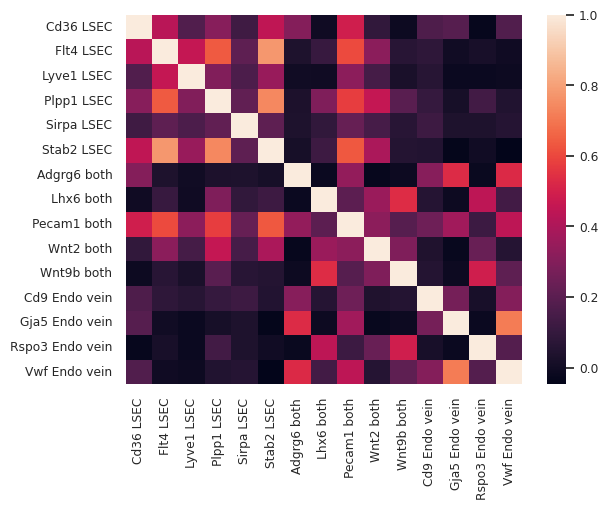

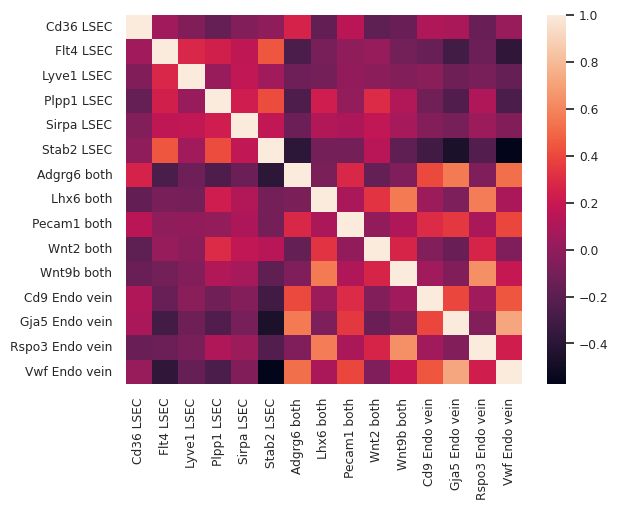

In [14]:
# plot correlation matrix of the gene expression of the marker genes of 2 confused cell types
# confusion between LSECs and Endo vein cells
# expression of all cells
correlation_matrix_expression_marker_genes_of_2_cell_types(sdata.table,path_mg,'LSEC','Endo vein')
plt.show()
# expression of cells that are classified as fibroblasts or stellate cells
adata_sub = sdata.table[(sdata.table.obs['annotation_own_score_genes'] == 'LSEC') | (sdata.table.obs['annotation_own_score_genes'] == 'Endo vein'),:]
correlation_matrix_expression_marker_genes_of_2_cell_types(adata_sub,path_mg,'LSEC','Endo vein')

<AxesSubplot: >

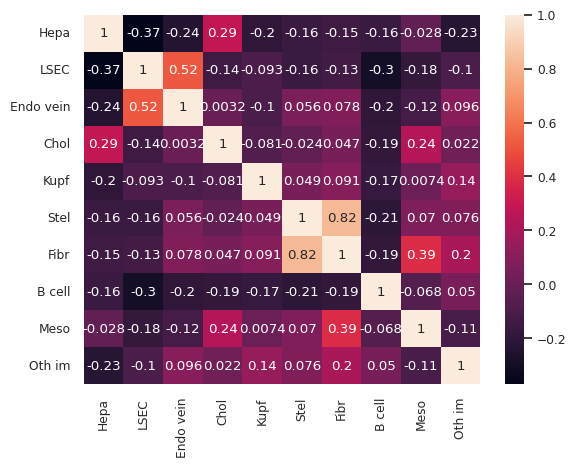

In [15]:
# plot correlation matrix of the features
sns.heatmap(scores.corr(method='pearson'), annot=True)
# sns.heatmap(scores_minmax.corr(method='pearson'), annot=True) gives the same heatmap

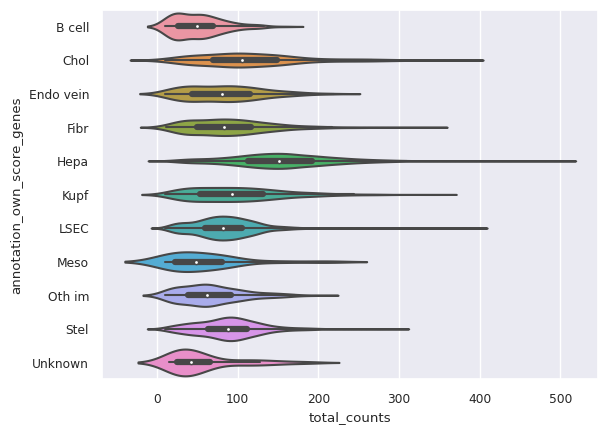

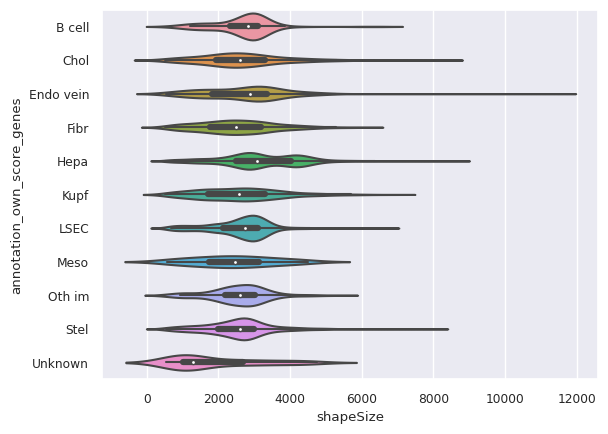

<AxesSubplot: xlabel='count_density', ylabel='annotation_own_score_genes'>

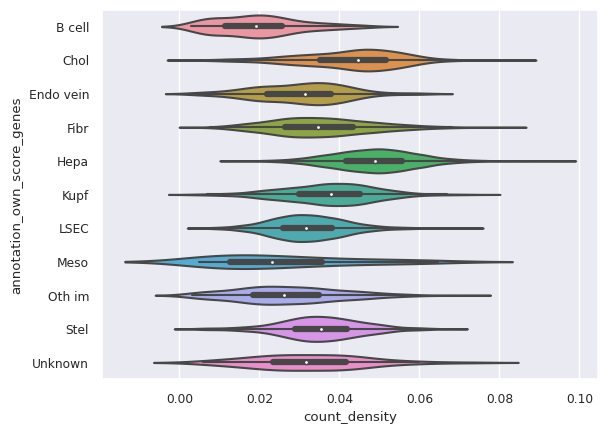

In [16]:
sns.violinplot(data=sdata.table.obs,x="total_counts",y="annotation_own_score_genes")
plt.show()
sns.violinplot(data=sdata.table.obs,x="shapeSize",y="annotation_own_score_genes")
plt.show()
sdata.table.obs['count_density'] = sdata.table.obs['total_counts'] / sdata.table.obs['shapeSize']
sns.violinplot(data=sdata.table.obs,x="count_density",y="annotation_own_score_genes")

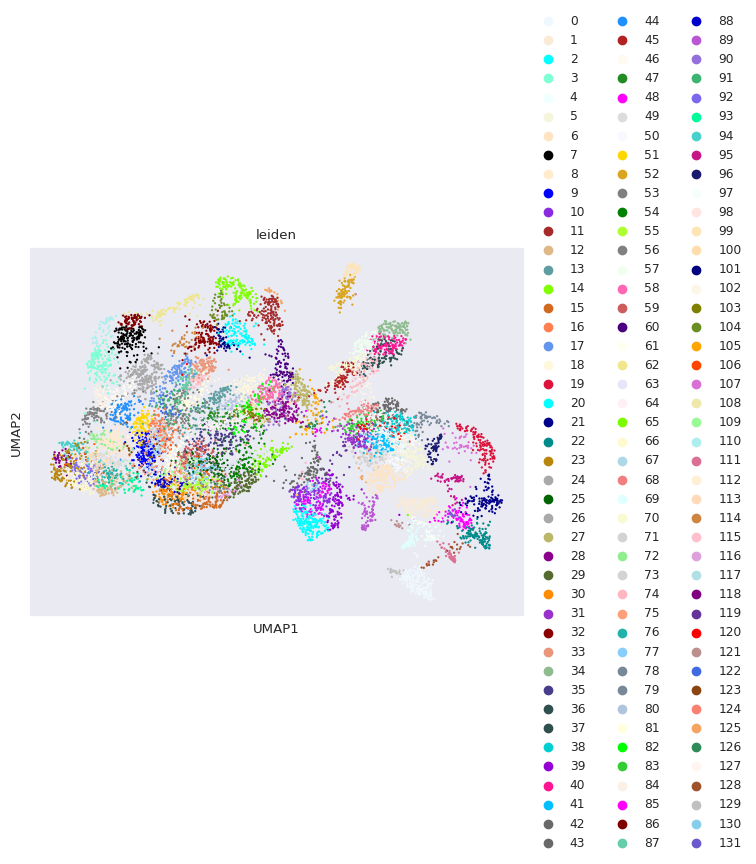

In [17]:
sc.tl.leiden(sdata.table,resolution=10,key_added='leiden')
sc.pl.umap(sdata.table,color='leiden',palette=list(matplotlib.colors.CSS4_COLORS.values()))

Index(['B cell', 'Chol', 'Endo vein', 'Fibr', 'Hepa', 'Kupf', 'LSEC', 'Meso',
       'Oth im', 'Stel', 'Unknown'],
      dtype='object')
Hepa
[3, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 20, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 35, 36, 44, 46, 47, 49, 51, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 72, 73, 75, 76, 77, 79, 80, 81, 82, 84, 86, 87, 88, 90, 91, 92, 93, 94, 98, 100, 101, 103, 104, 106, 108, 109, 110, 113, 114, 115, 116, 118, 122, 123, 124, 127]
Kupf
[34, 37, 40, 45, 57, 69, 70, 74, 102, 121]
LSEC
[4, 5, 6, 31, 38, 41, 43, 50, 71, 78, 83, 95, 96, 112, 117, 120]
Endo vein
[19, 89, 107]
Fibr
[21, 22, 48, 131]
Stel
[2, 10, 39, 42, 85, 119, 130]
Meso
[]
Chol
[0, 129]
B cell
[52, 99]
Oth im
[1, 97, 111]
Unknown
[105, 125, 126, 128]


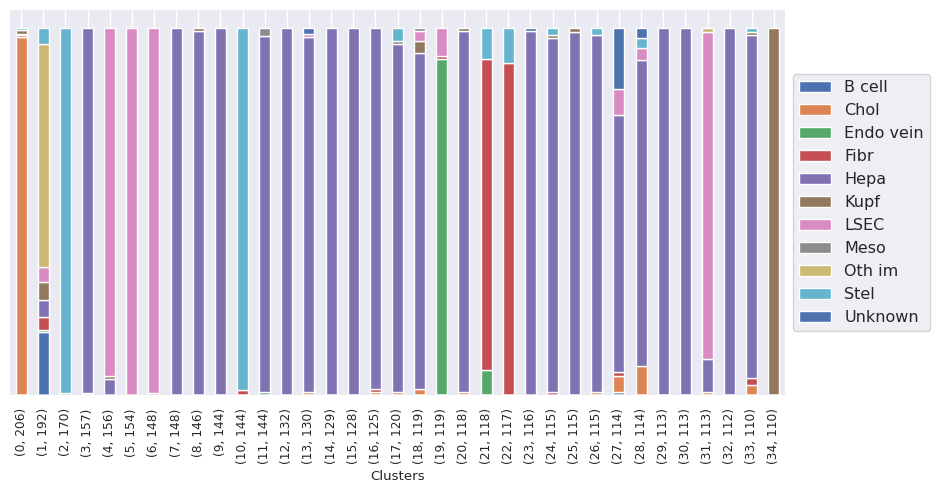

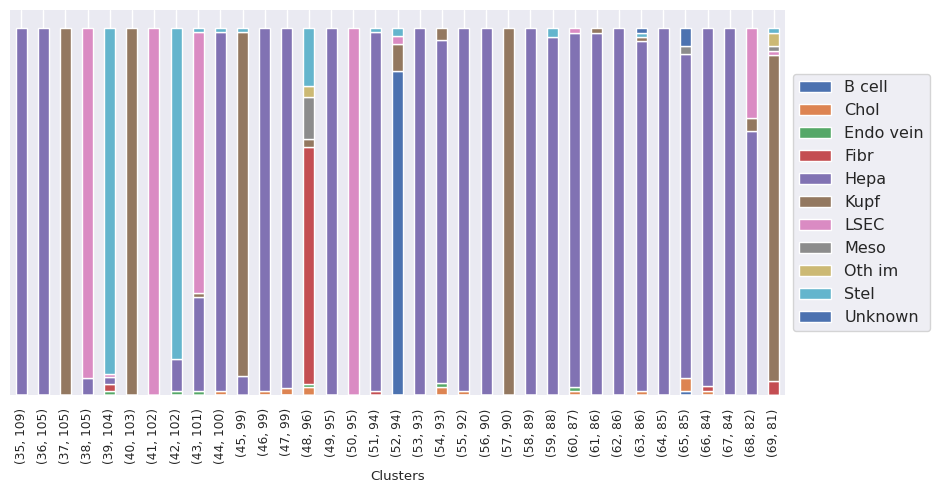

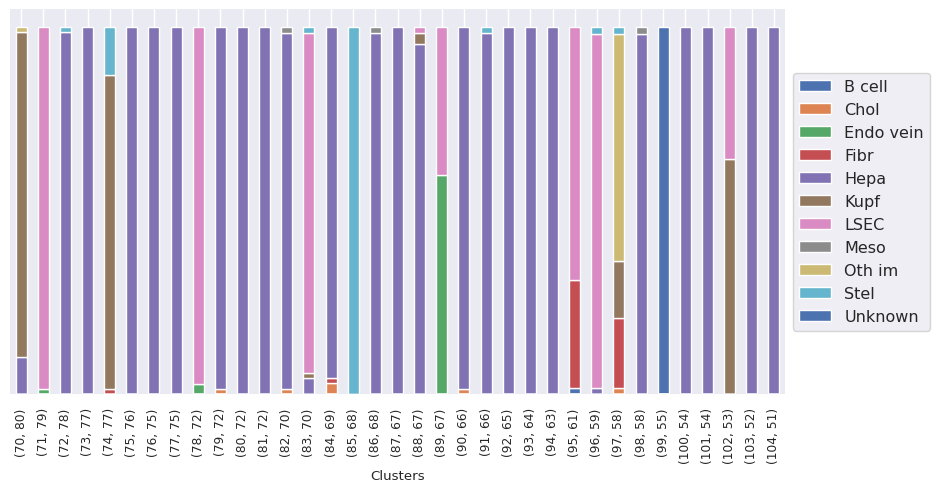

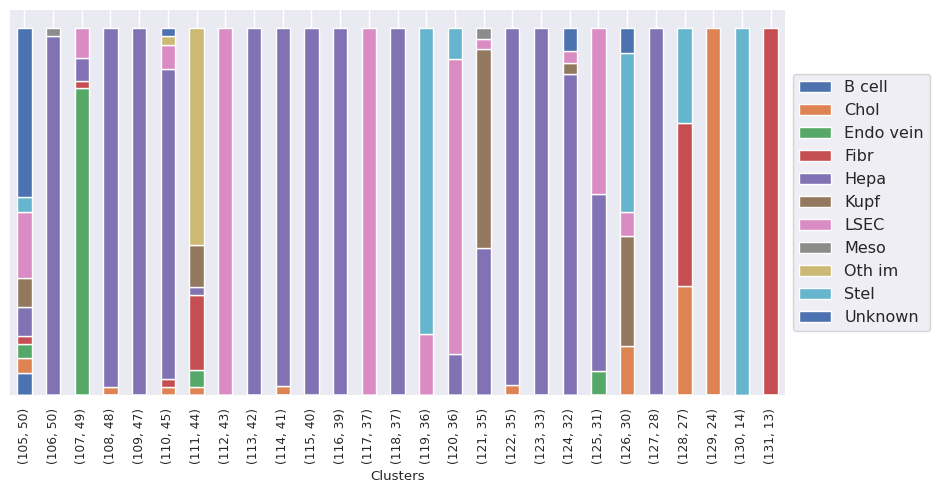

In [18]:
cell_types = ['Hepa','Kupf','LSEC','Endo vein','Fibr','Stel','Meso','Chol','B cell','Oth im','Unknown']
leiden_clusters_per_ct = clusteringVSleiden(sdata.table, "annotation_own_score_genes", "leiden",cell_types)

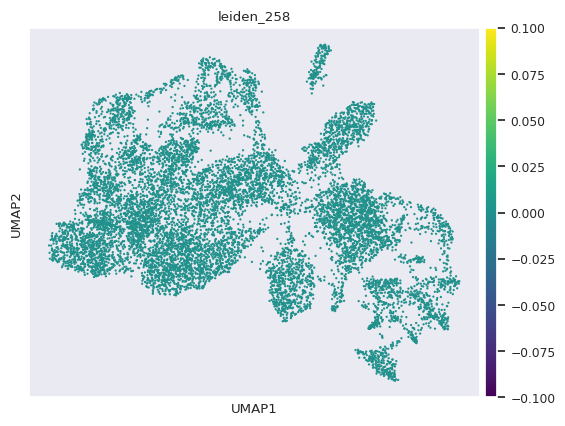

In [19]:
sdata.table.obs['leiden_258'] = (sdata.table.obs['leiden'] == '258').astype(int)
sc.pl.umap(sdata.table,color=['leiden_258'],color_map='viridis')

In [20]:
a = sdata.table.obs['leiden']
i = 0
for putative_leiden_clusters in leiden_clusters_per_ct:
    L = [str(x) for x in putative_leiden_clusters]
    for n in L:
        a = a.replace(n,cell_types[i])
    i += 1
sdata.table.obs['leiden_cell_types'] = a
# cells per leiden_cell_type cluster, to see the max number of n_cells you can take per cluster (149 in this case)
print(sdata.table.obs['leiden_cell_types'].value_counts())
min_cells_per_leiden_cell_type = sdata.table.obs['leiden_cell_types'].value_counts().min()
print(min_cells_per_leiden_cell_type)

Hepa         6936
LSEC         1431
Kupf          833
Stel          638
Fibr          344
Oth im        294
Endo vein     235
Chol          230
B cell        149
Unknown       138
Name: leiden_cell_types, dtype: int64
138


149
Summary:
Fibr
Maybe drop:[['Fn1', 'Hepa'], ['Fn1', 'Stel'], ['Cxcl12', 'Stel'], ['Nrxn1', 'Stel'], ['Hgf', 'Stel'], ['Reln', 'Stel'], ['Fn1', 'Chol']]
Stel
Maybe drop:[['Fn1', 'Hepa'], ['Adamtsl2', 'Fibr'], ['Des', 'Fibr']]
LSEC
Maybe drop:[['Lhx6', 'Endo vein'], ['Adgrg6', 'Endo vein']]
Oth im
Maybe drop:[['Cd9', 'Endo vein'], ['Cd9', 'Chol']]
Summary:
Fibr
Maybe drop:[['Fn1', 'Hepa'], ['Cxcl12', 'Stel'], ['Fn1', 'Stel'], ['Nrxn1', 'Stel'], ['Hgf', 'Stel'], ['Reln', 'Stel'], ['Fn1', 'Chol']]
Stel
Maybe drop:[['Fn1', 'Hepa'], ['Adamtsl2', 'Fibr']]
Chol
Maybe drop:[['Fn1', 'Hepa']]
LSEC
Maybe drop:[['Lhx6', 'Endo vein'], ['Adgrg6', 'Endo vein']]
Oth im
Maybe drop:[['Cd9', 'Endo vein'], ['Cd9', 'Chol']]
Summary:
Fibr
Maybe drop:[['Fn1', 'Hepa'], ['Cxcl12', 'Stel'], ['Fn1', 'Stel'], ['Nrxn1', 'Stel'], ['Hgf', 'Stel'], ['Reln', 'Stel'], ['Fn1', 'Chol']]
Chol
Maybe drop:[['Fn1', 'Hepa']]
LSEC
Maybe drop:[['Adgrg6', 'Endo vein']]
Oth im
Maybe drop:[['Cd9', 'Endo vein'], ['Cd9', 'Chol']]


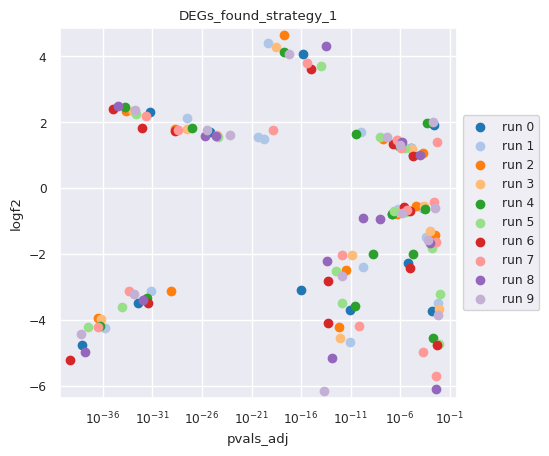

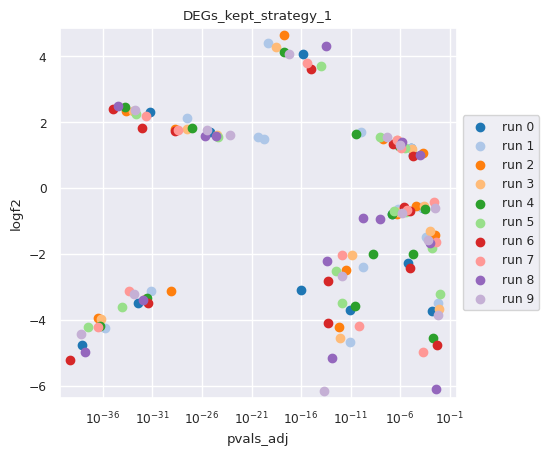

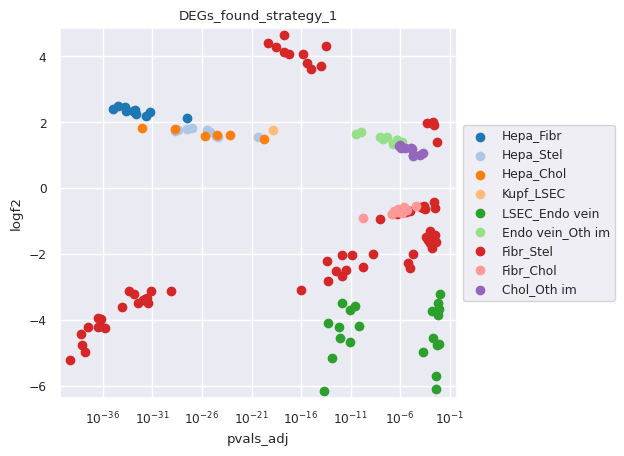

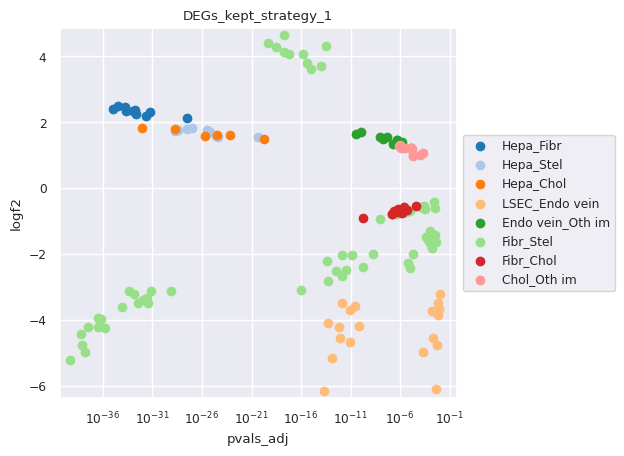

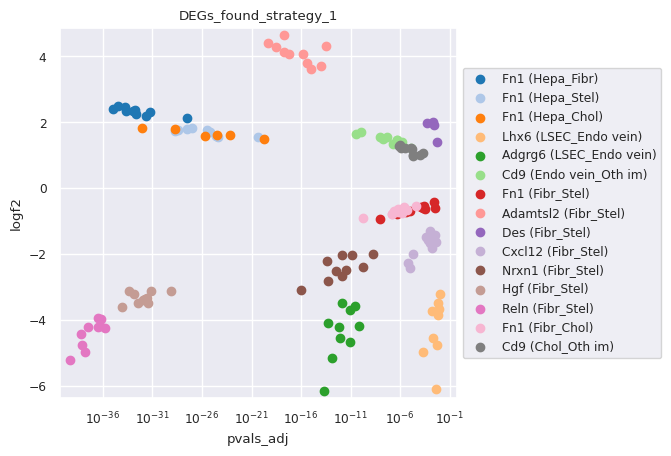

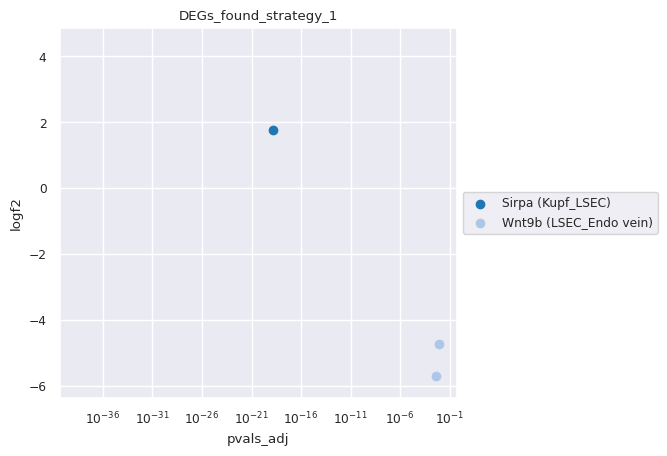

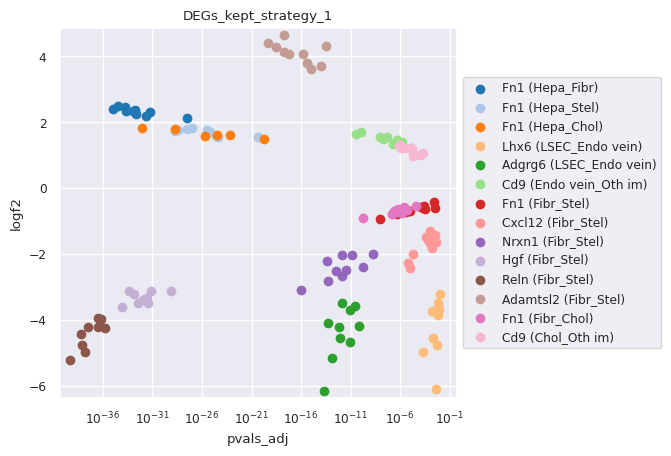

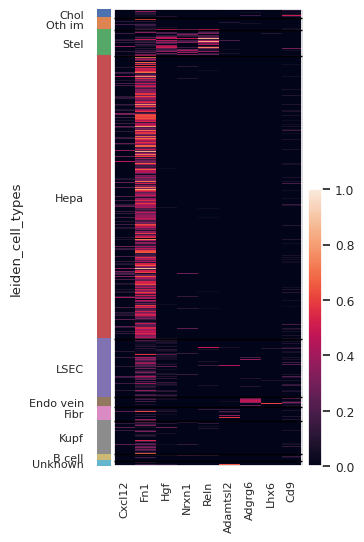

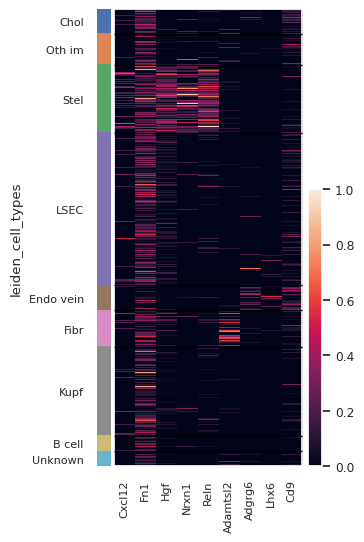

In [21]:
# STRATEGY 1 to change the marker gene list
results_strat1_10, results_runs1_10, DEG_details_runs1_10 = Apply_strategy_multiple_times(sdata.table,cell_types,leiden_clusters_per_ct,path_mg,10,1)

In [22]:
# Update marker gene list based on STRATEGY 1:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat1_10.keys()
for key in keys:
    f = [x[0] for x in results_strat1_10[key]]
    f = np.unique(f).tolist()
    df_mg.loc[f,key] = 0
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm_modified1.csv")

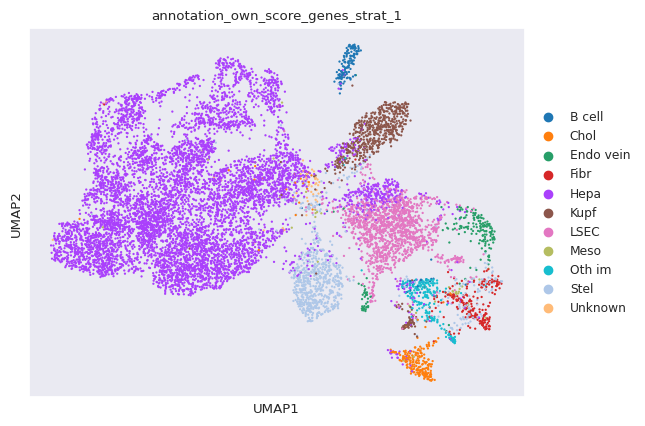

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_1
B cell                               1.505166
Chol                                 2.119701
Endo vein                            1.727823
Fibr                                 2.003919
Hepa                                65.167439
Kupf                                 5.664410
LSEC                                12.157107
Meso                                 0.400784
Oth im                               1.923762
Stel                                 6.964731
Unknown                              0.365159


In [23]:
# Own score genes with modified marker gene list based on STRATREGY 1
path_mg_mod1 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm_modified1.csv"
scores = own_score_genes(sdata.table,path_mg_mod1,suffix='_strat_1')
visualize_classification(sdata,'annotation_own_score_genes_strat_1','umap_23_15',path_mg_mod1,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

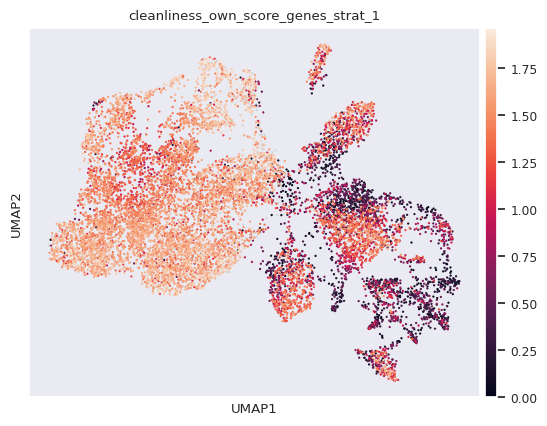

In [24]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_1'])

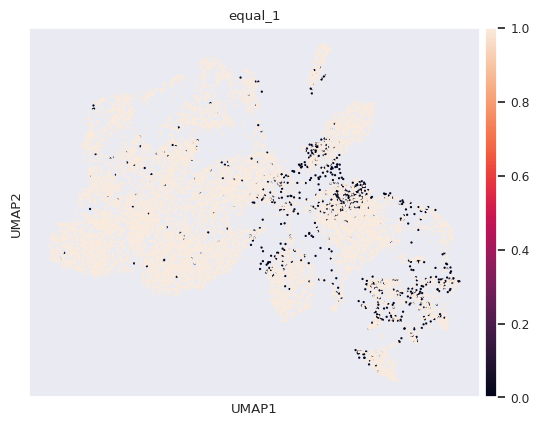

In [25]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_1'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_1'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_1'])

Hepa         10
LSEC          9
Endo vein     9
Chol          6
Kupf         16
Stel         14
Fibr         16
B cell        4
Meso          5
Oth im        3
dtype: int64


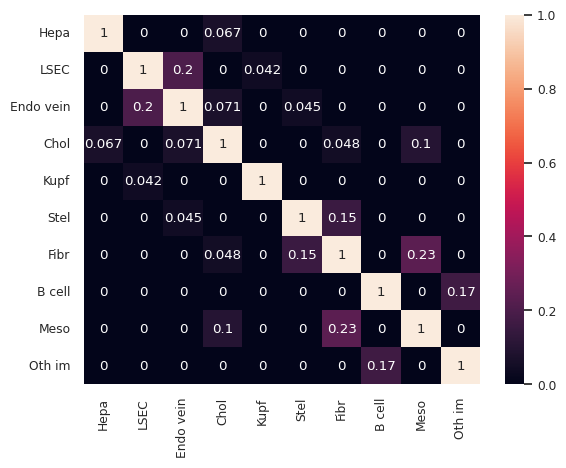

In [26]:
Jaccard_similarity_matrix(path_mg_mod1)

149
Axl
Is marker gene of: ['Kupf']
Could also be a marker gene of: ['Fibr']
Ccr2
Is marker gene of: []
Could also be a marker gene of: ['Oth im']
Cd36
Is marker gene of: ['LSEC']
Could also be a marker gene of: ['Endo vein']
Cd3e
Is marker gene of: []
Could also be a marker gene of: ['Oth im']
Clec9a
Is marker gene of: []
Could also be a marker gene of: ['Kupf', 'Oth im']
Cx3cr1
Is marker gene of: []
Could also be a marker gene of: ['Chol']
Cxcl12
Is marker gene of: ['Stel', 'Fibr']
Could also be a marker gene of: ['Hepa']
Cyp2e1
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['Kupf', 'LSEC', 'Stel']
Dpt
Is marker gene of: ['Fibr']
Could also be a marker gene of: ['Chol']
Flt4
Is marker gene of: ['LSEC']
Could also be a marker gene of: ['Endo vein']
Gdf15
Is marker gene of: []
Could also be a marker gene of: ['Hepa', 'LSEC']
Ghr
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['Stel']
Glul
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['Endo vein

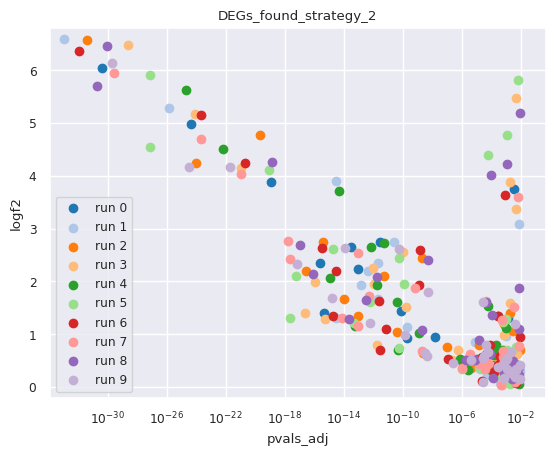

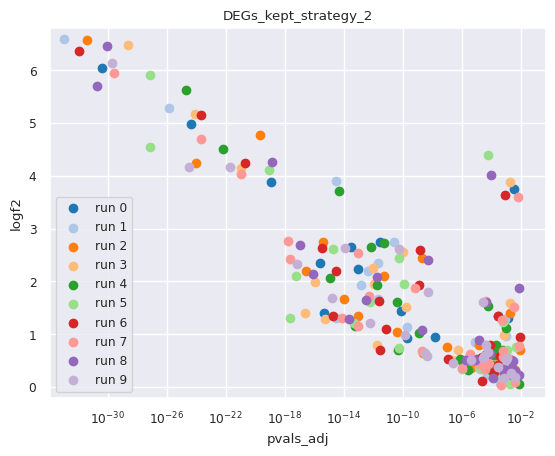

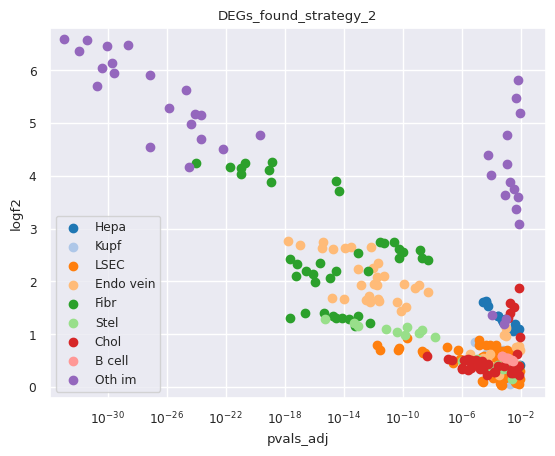

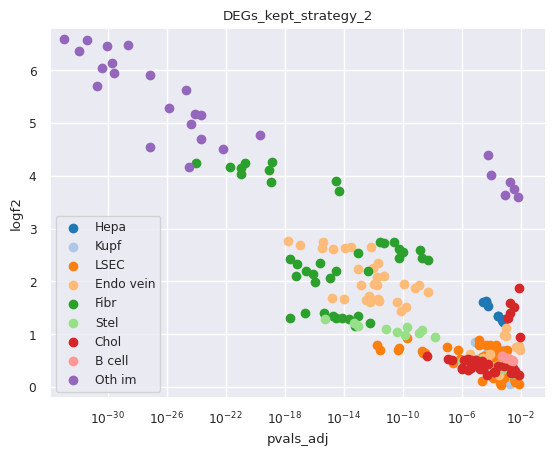

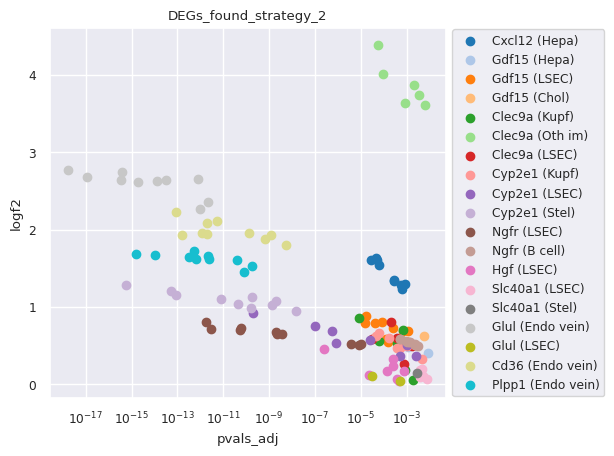

...

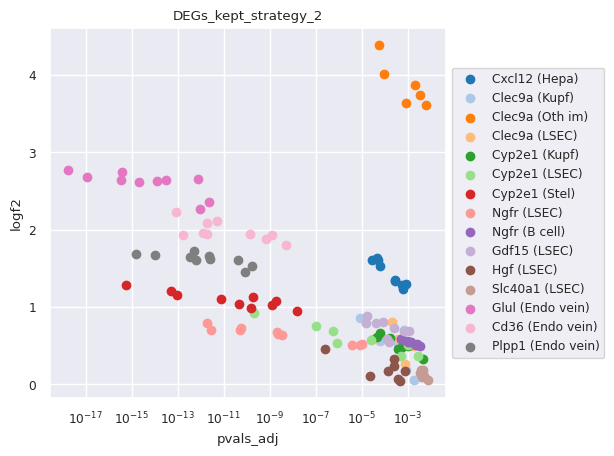

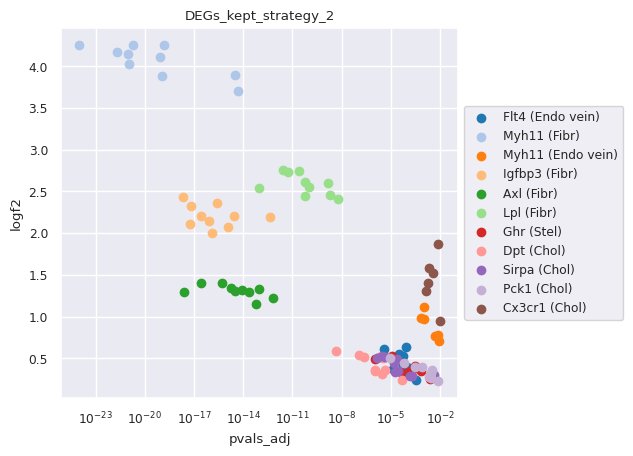

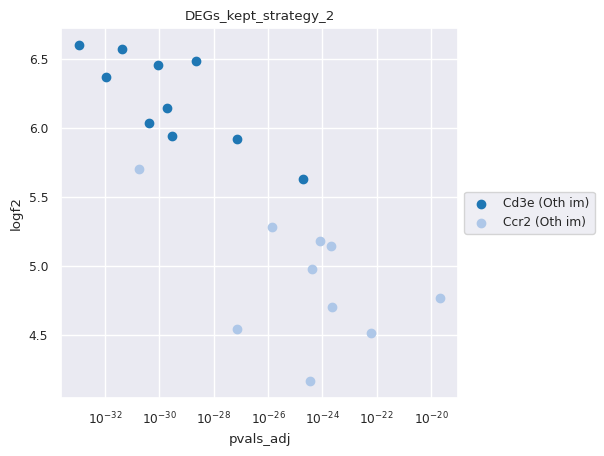

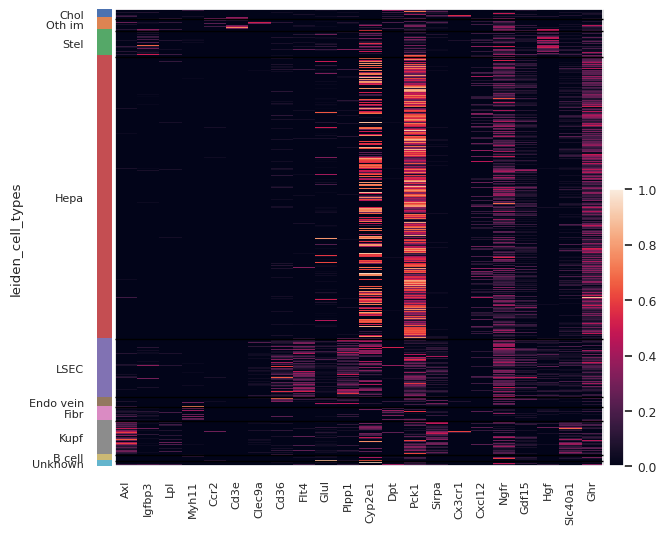

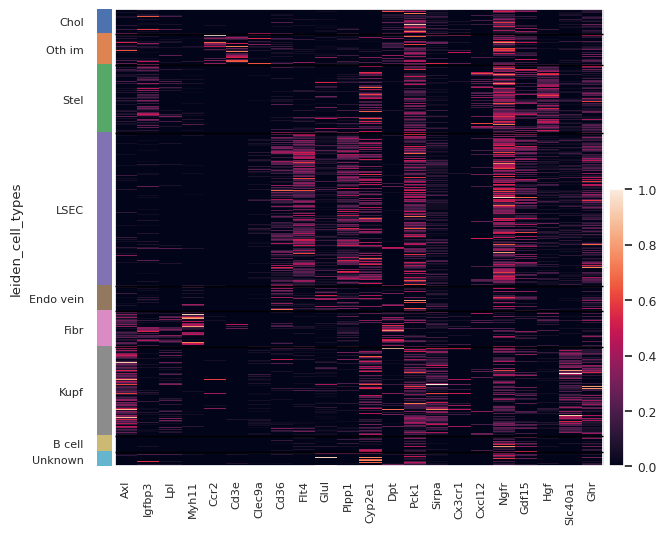

In [27]:
# STRATEGY 2 to change the marker gene list
results_strat2_10, results_runs2_10, DEG_details_runs2_10 = Apply_strategy_multiple_times(sdata.table,cell_types,leiden_clusters_per_ct,path_mg,10,2)

In [28]:
# Update marker gene list based on STRATEGY 2:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat2_10.keys()
for key in keys:
    df_mg.loc[results_strat2_10[key],key] = 1
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm_modified2.csv")

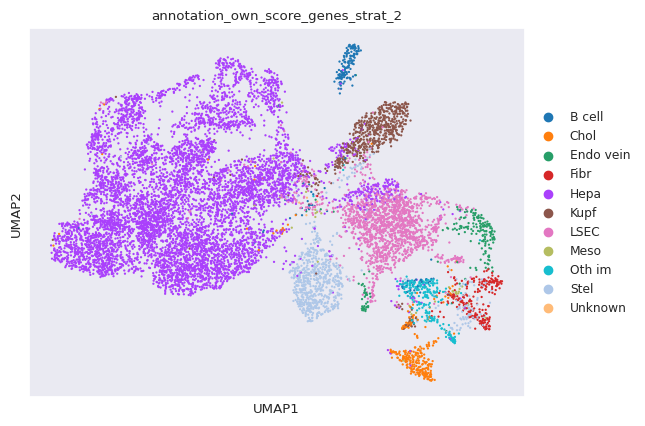

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_2
B cell                               1.825793
Chol                                 2.778767
Endo vein                            1.799074
Fibr                                 2.003919
Hepa                                62.994300
Kupf                                 5.379409
LSEC                                14.134307
Meso                                 0.374065
Oth im                               2.137513
Stel                                 6.537228
Unknown                              0.035625


In [29]:
# Own score genes with modified marker gene list based on STRATREGY 2
path_mg_mod2 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm_modified2.csv"
scores = own_score_genes(sdata.table,path_mg_mod2,suffix='_strat_2')
visualize_classification(sdata,'annotation_own_score_genes_strat_2','umap_23_15',path_mg_mod2,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

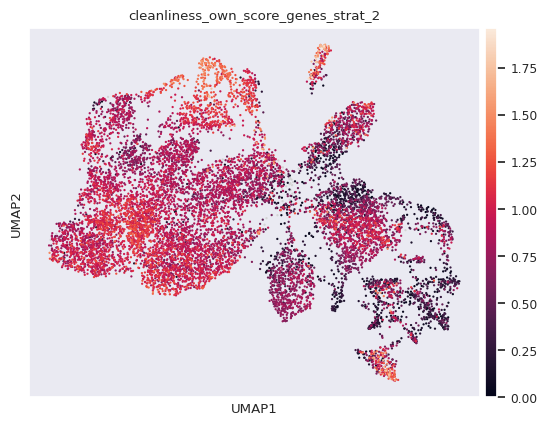

In [30]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_2'])
# makes sense that this becomes worse, because more marker genes overlap between cell types
# but does not mean that the annotation is worse

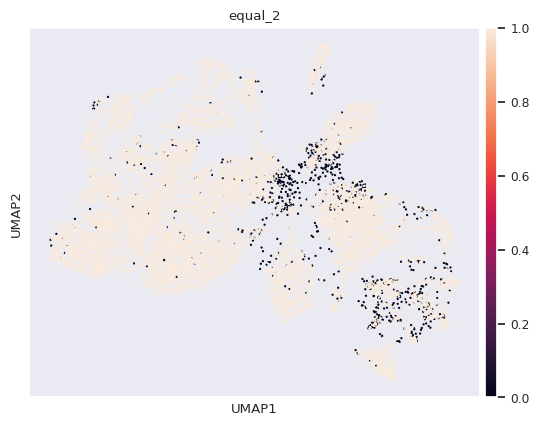

In [31]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_2'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_2'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_2'])

Hepa         11
LSEC         17
Endo vein    14
Chol         11
Kupf         18
Stel         18
Fibr         25
B cell        5
Meso          5
Oth im        7
dtype: int64


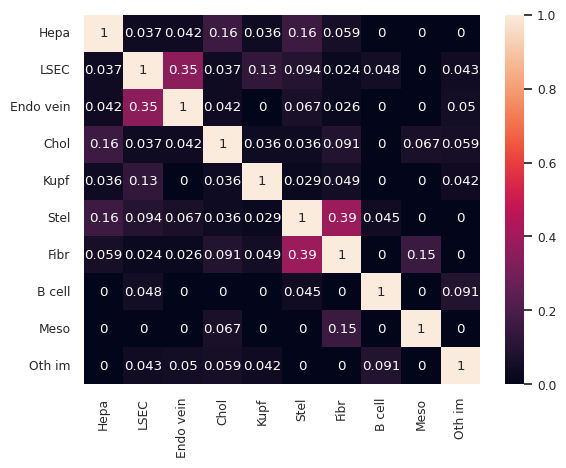

In [32]:
Jaccard_similarity_matrix(path_mg_mod2)

In [33]:
# STRATEGY 1 and STRATEGY 2 combined to change the marker gene list

In [34]:
# Update marker gene list based on STRATEGY 1 and STRATEGY 2:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat1_10.keys()
for key in keys:
    f = [x[0] for x in results_strat1_10[key]]
    f = np.unique(f).tolist()
    df_mg.loc[f,key] = 0
keys = results_strat2_10.keys()
for key in keys:
    df_mg.loc[results_strat2_10[key],key] = 1
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm_modified_1_2.csv")

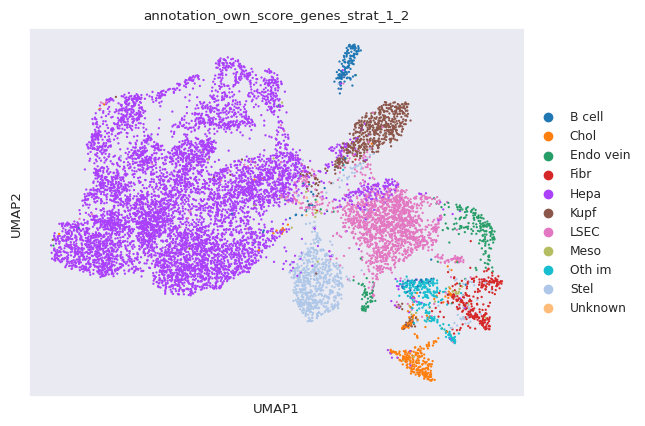

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_1_2
B cell                                 1.772355
Chol                                   2.716423
Endo vein                              2.137513
Fibr                                   2.449234
Hepa                                  62.816174
Kupf                                   5.299252
LSEC                                  14.267902
Meso                                   0.391877
Oth im                                 2.110794
Stel                                   6.002850
Unknown                                0.035625


In [35]:
# Own score genes with modified marker gene list based on STRATREGY 1 and STRATEGY 2
path_mg_mod_1_2 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListBasic_othIm_modified_1_2.csv"
scores = own_score_genes(sdata.table,path_mg_mod_1_2,suffix='_strat_1_2')
visualize_classification(sdata,'annotation_own_score_genes_strat_1_2','umap_23_15',path_mg_mod_1_2,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

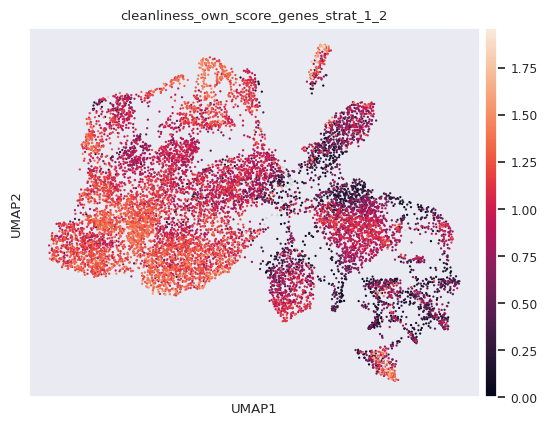

In [36]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_1_2'])

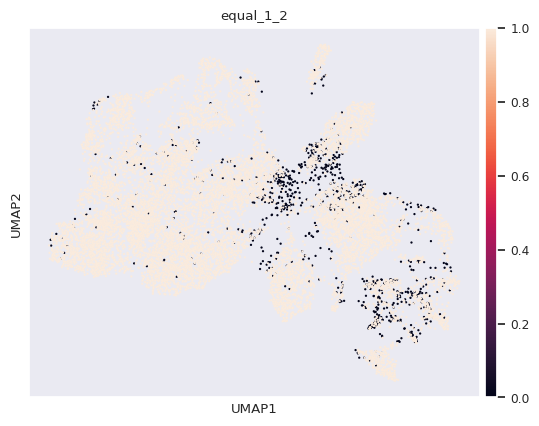

In [37]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_1_2'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_1_2'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_1_2'])

Hepa         11
LSEC         15
Endo vein    14
Chol         10
Kupf         18
Stel         16
Fibr         20
B cell        5
Meso          5
Oth im        6
dtype: int64


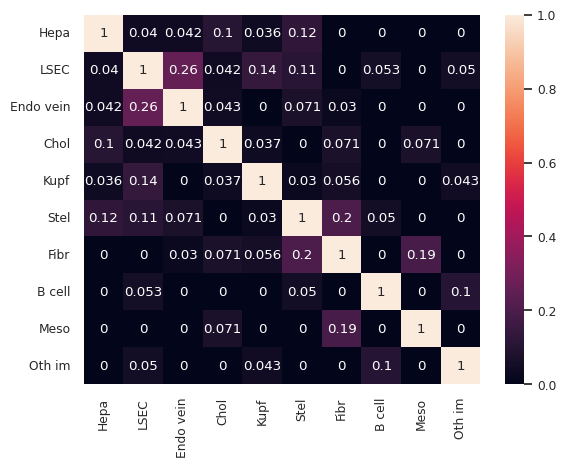

In [38]:
Jaccard_similarity_matrix(path_mg_mod_1_2)

Hepa         0.628162
LSEC         0.142679
Stel         0.060029
Kupf         0.052993
Chol         0.027164
Fibr         0.024492
Endo vein    0.021375
Oth im       0.021108
B cell       0.017724
Meso         0.003919
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


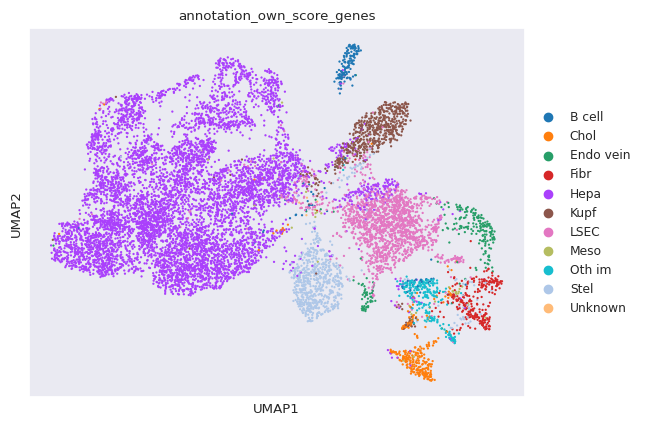

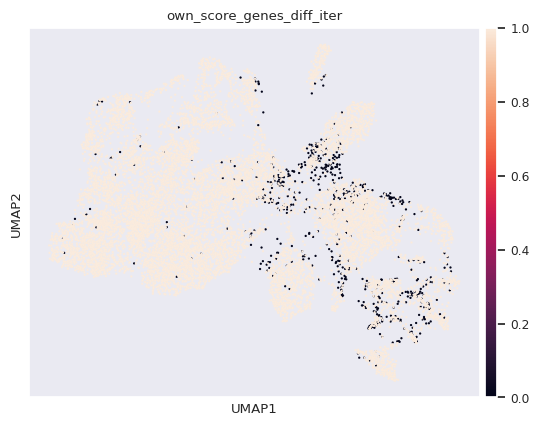

0.05610972568578554


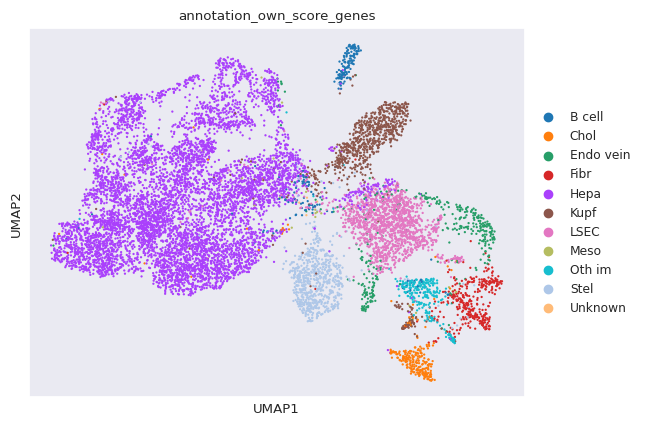

Hepa         0.610438
LSEC         0.124777
Kupf         0.071696
Stel         0.059138
Fibr         0.031706
Endo vein    0.031528
Chol         0.024047
Oth im       0.022800
B cell       0.021286
Meso         0.002227
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


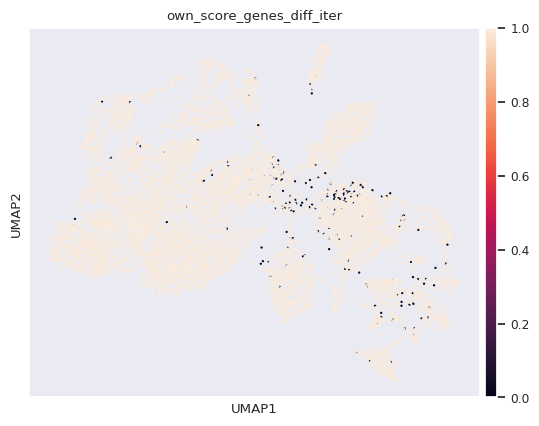

0.01790167438546491


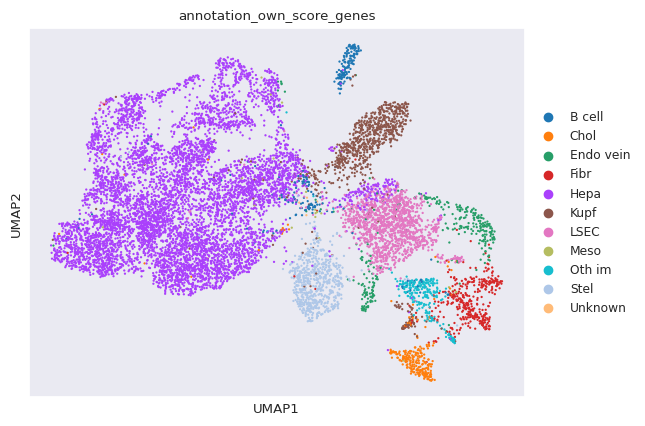

Hepa         0.617029
LSEC         0.118721
Kupf         0.073744
Stel         0.054685
Fibr         0.034556
Endo vein    0.027788
B cell       0.024670
Chol         0.024136
Oth im       0.021999
Meso         0.002316
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


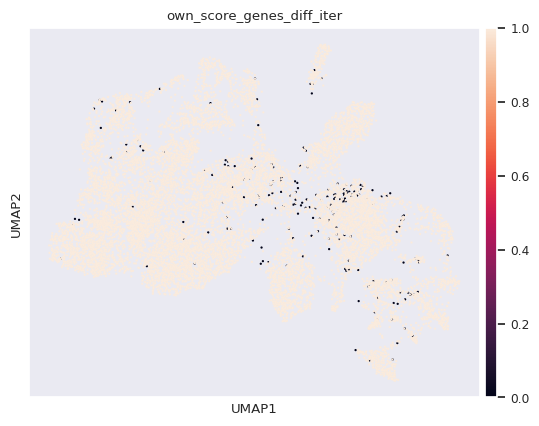

0.017812611328820806


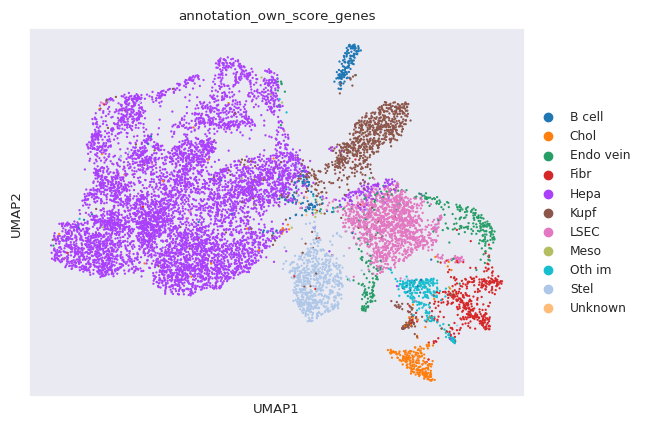

Hepa         0.607321
LSEC         0.117652
Kupf         0.079444
Stel         0.056733
Fibr         0.036249
Endo vein    0.031172
Chol         0.024314
B cell       0.022444
Oth im       0.022444
Meso         0.001870
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


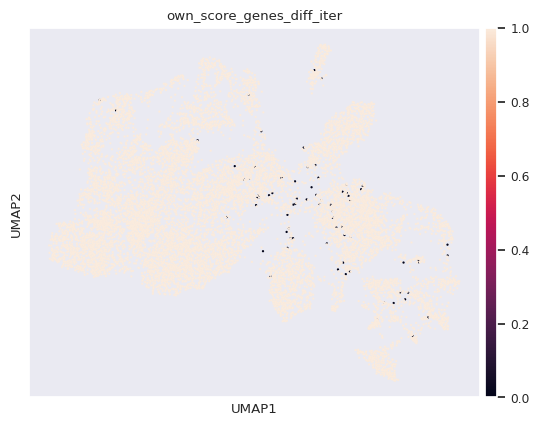

0.006590666191663698


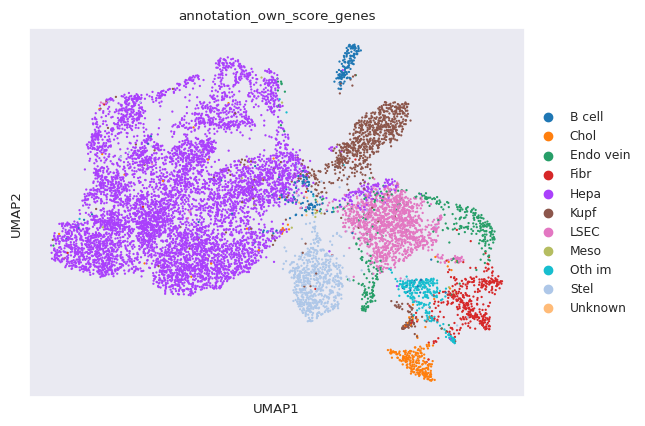

Hepa         0.608568
LSEC         0.116940
Kupf         0.076238
Stel         0.057980
Fibr         0.035002
Endo vein    0.032775
Chol         0.024403
B cell       0.023067
Oth im       0.022978
Meso         0.001692
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


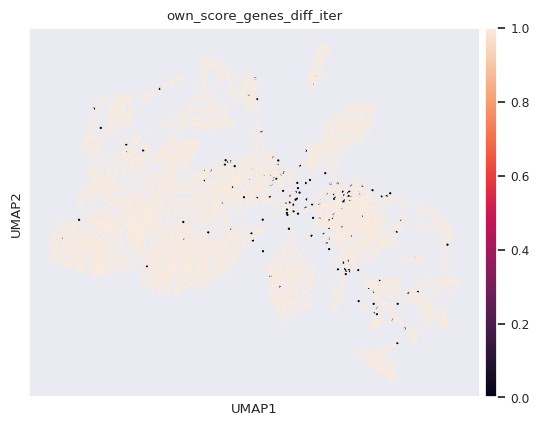

0.013893836836480229


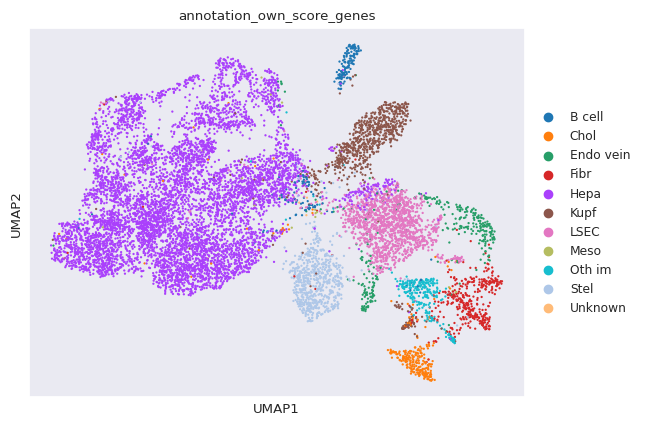

Hepa         0.611596
LSEC         0.123709
Kupf         0.070716
Stel         0.058247
Fibr         0.035091
Endo vein    0.028411
Chol         0.025294
Oth im       0.023602
B cell       0.021019
Meso         0.001959
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


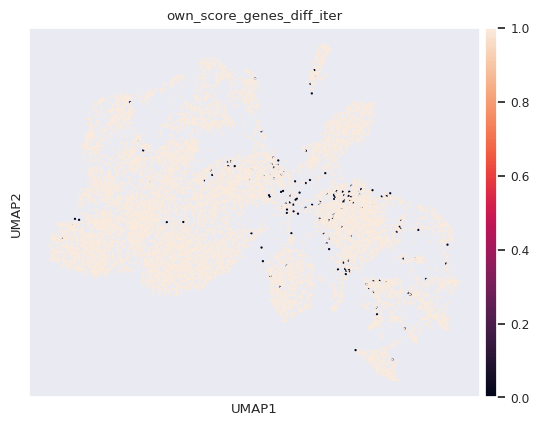

0.012557890986818667


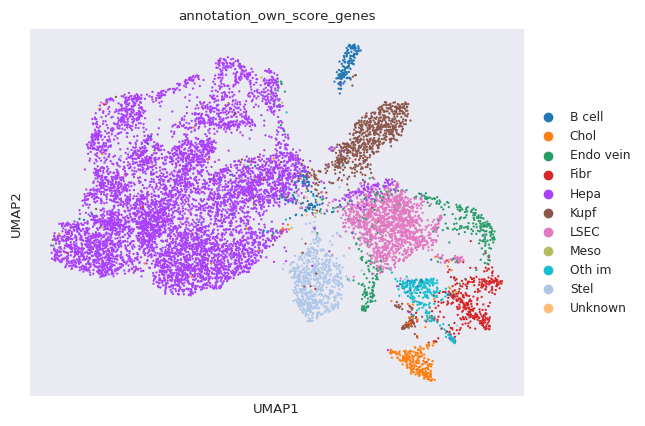

Hepa         0.610349
LSEC         0.118721
Kupf         0.072497
Stel         0.056377
Fibr         0.034111
Endo vein    0.033933
Chol         0.024670
B cell       0.024492
Oth im       0.022444
Meso         0.002048
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


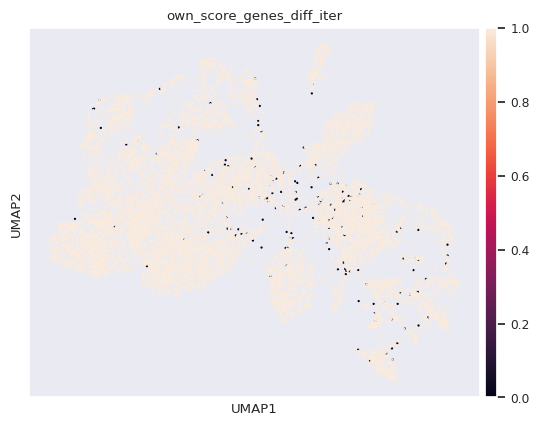

0.013626647666547916


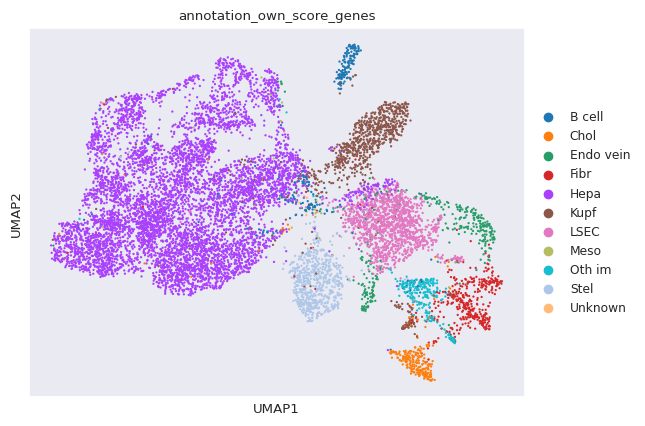

Hepa         0.606698
LSEC         0.119879
Kupf         0.077485
Stel         0.055575
Fibr         0.036071
Endo vein    0.029747
B cell       0.026006
Chol         0.023156
Oth im       0.022622
Meso         0.002405
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


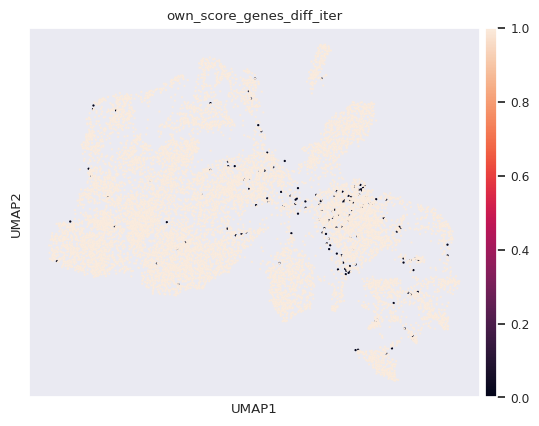

0.01282508015675098


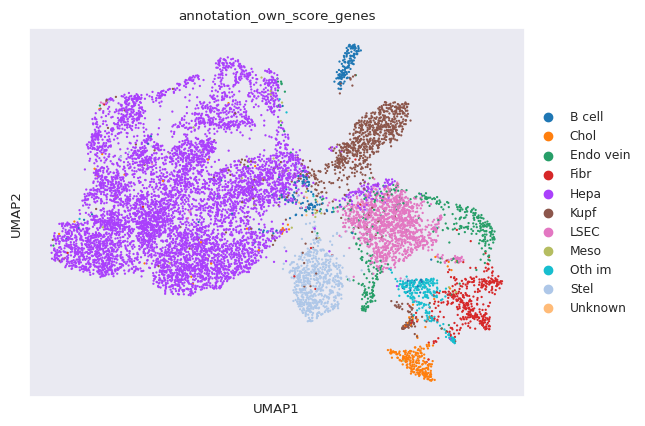

Hepa         0.605094
LSEC         0.113466
Kupf         0.079266
Stel         0.055664
Endo vein    0.036516
Fibr         0.035536
Chol         0.024670
B cell       0.024047
Oth im       0.022177
Meso         0.003206
Unknown      0.000356
Name: annotation_own_score_genes, dtype: float64


[0.05610972568578554,
 0.01790167438546491,
 0.017812611328820806,
 0.006590666191663698,
 0.013893836836480229,
 0.012557890986818667,
 0.013626647666547916,
 0.01282508015675098]

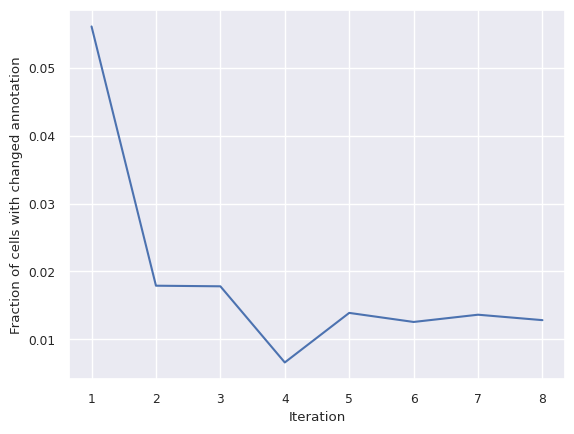

In [39]:
# Own score genes iterative with basic marker gene list updated with strategy 1 and 2
own_score_genes_iterative(sdata.table,path_mg_mod_1_2,nr_iterations=8)